#Assignment 1: Submit a write-up on the following:

- Hugging face agents  

- Hugging face pipeline for text generation

- HF inference endpoints

- Give feedback on the image generation and explore different models available on the Hugging Face website



#Assignment 2: Using OpenAI's CLIP Model for Image Captioning and Building an Image Search Engine

#Objective

##In this assignment, you will use OpenAI's CLIP (Contrastive Language-Image Pre-training) model to:
- Generate captions for 15 different images.
- Build a search engine for these images using a larger dataset of images.


##Part 1: Generate Captions for Images

##Part 2: Build an Image Search Engine


##Submission
Submit the following as a **Streamlit** app:

- Your Python code for generating captions and building the search engine.
- A report describing your approach, challenges faced, and how you overcame them.
- Screenshots of the interface and results.

Evaluation Criteria

- Correctness and efficiency of the code.
- Clarity and completeness of the report.
- Usability and functionality of the search engine interface.

#Please don't use any Generative AI Models

#Assignment 1: Submit a write-up on the following:

- Hugging face agents:  
  it is a Framwark that looks like a company has many departments each department do specific task.
  Ex: training a model to sort text into categories.

- Hugging face pipeline for text generation:
  it can be answring questions very simply.
  Ex: Chat GPT answering your questions.
  

- HF inference endpoints:
  it can handle many requests at once, making sure it works quickly and smoothly for everyone
  Ex: chatbot on an online store helping multiple customers at the same time.
  

- Give feedback on the image generation and explore different models available on the Hugging Face website

High Quality: These models create very clear and detailed images.

Customizable: Some models let you change the style and details of the images.

Speed: These models can generate images faster than before.

In [ ]:
from google.colab import files


In [ ]:
#This is to upload files from my labtop to Google Colab environment
uploaded = files.upload()


Saving 1024px-english_daisy_bellis_perennis-1.jpg to 1024px-english_daisy_bellis_perennis-1 (1).jpg
Saving A_Flower_(3689886060).jpg to A_Flower_(3689886060) (1).jpg
Saving MTc0MzU0MDEzMjM0NDA2NzYw.webp to MTc0MzU0MDEzMjM0NDA2NzYw (1).webp
Saving MTc0MzU0MDEzMjM0NDcyNTgy.webp to MTc0MzU0MDEzMjM0NDcyNTgy (1).webp
Saving MTc0MzU0MDEzMjM0NjAzNjU0.webp to MTc0MzU0MDEzMjM0NjAzNjU0 (1).webp
Saving MTc0MzU0MDEzMjM0NjY5MTkw.webp to MTc0MzU0MDEzMjM0NjY5MTkw (1).webp
Saving MTc0MzU0MDEzMjM0OTMxMzM0.webp to MTc0MzU0MDEzMjM0OTMxMzM0 (1).webp
Saving MTc0MzU0MDEzMjM1MjU5MDE0.webp to MTc0MzU0MDEzMjM1MjU5MDE0 (1).webp
Saving MTc0MzU0MDEzMjM1MzkwMDg2.webp to MTc0MzU0MDEzMjM1MzkwMDg2 (1).webp
Saving MTc0MzU0MDEzMjM1NDU1NjIy.webp to MTc0MzU0MDEzMjM1NDU1NjIy (1).webp
Saving MTc0MzU0MDEzMjM1NTg2Njk0.webp to MTc0MzU0MDEzMjM1NTg2Njk0 (1).webp
Saving MTc0MzU0MDEzMjM1NzE3NzY2.webp to MTc0MzU0MDEzMjM1NzE3NzY2 (1).webp
Saving MTc0MzU0MDEzMjM1OTc5OTEw.webp to MTc0MzU0MDEzMjM1OTc5OTEw (1).webp
Saving MTk3NzU1NjU0N

In [ ]:
from matplotlib import pyplot as plt
import numpy as np
from PIL import Image
import requests

# list to store images
images = []

# Loop and open each image
for filename in uploaded.keys():
    # This is to open the image file
    image = Image.open(filename)
    images.append(image)

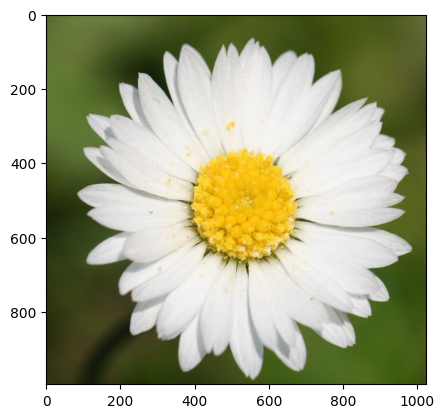

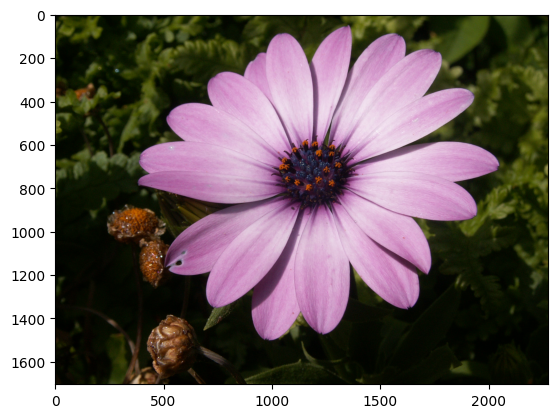

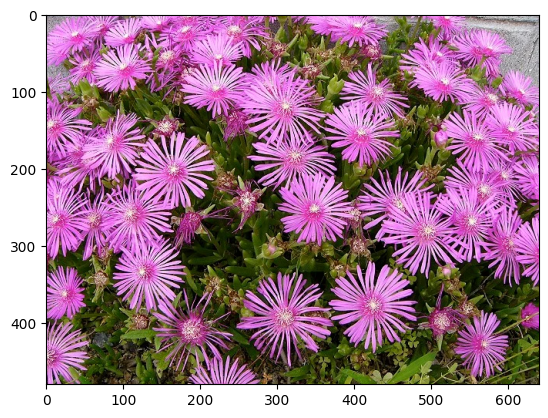

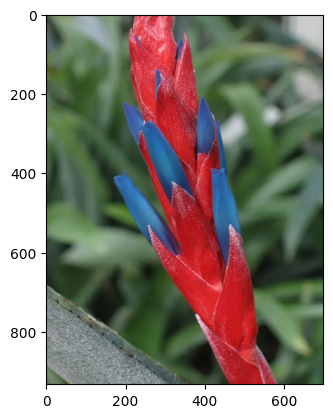

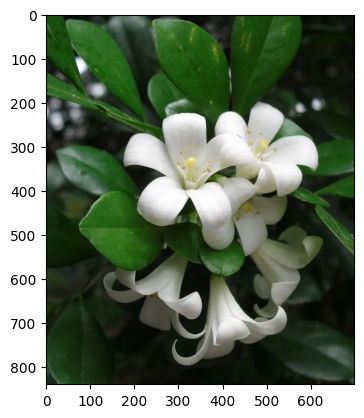

...

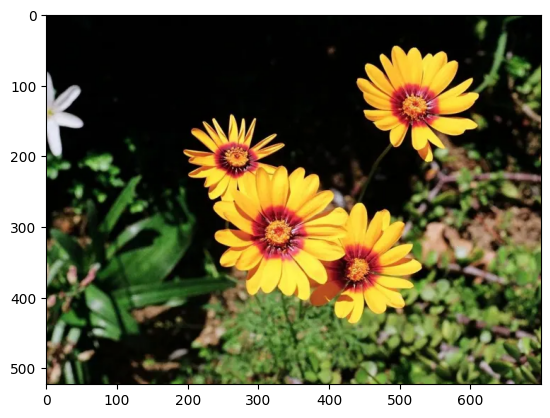

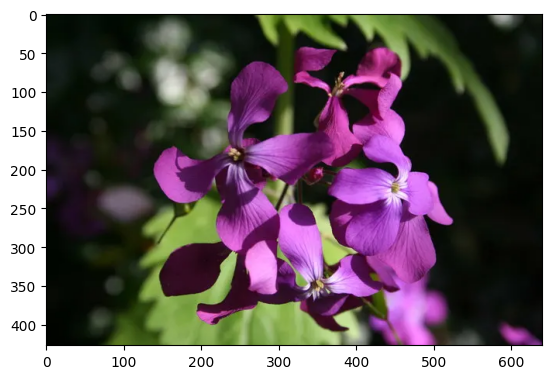

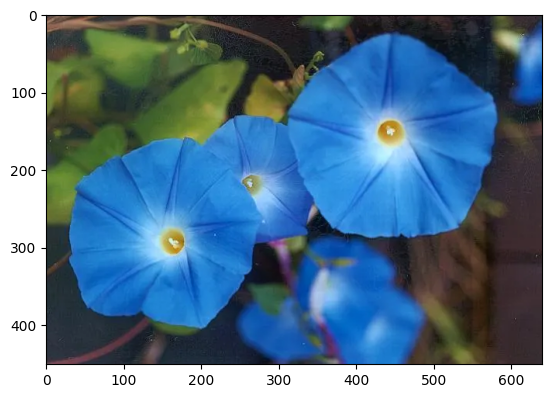

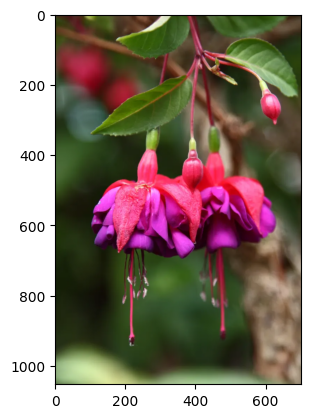

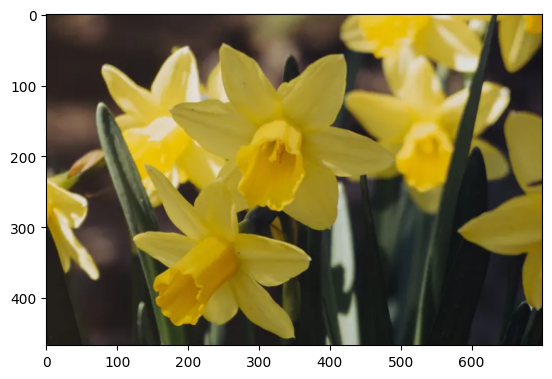

In [ ]:
# let's see what we have
for image in images:
    plt.imshow(np.asarray(image))
    plt.show()

In [ ]:
# Use a pipeline as a high-level helper
from transformers import pipeline

pipe = pipeline("image-to-text", model="Salesforce/blip-image-captioning-base")

In [ ]:
# Load model directly
from transformers import BlipProcessor, BlipForConditionalGeneration

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")


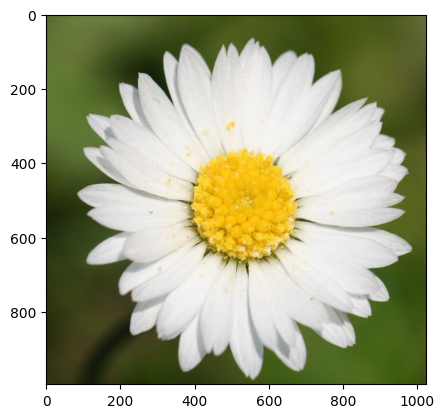

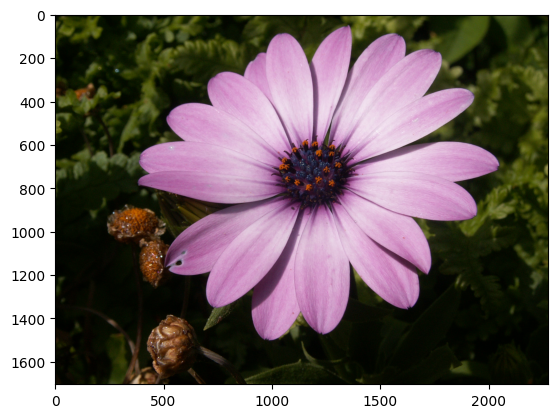

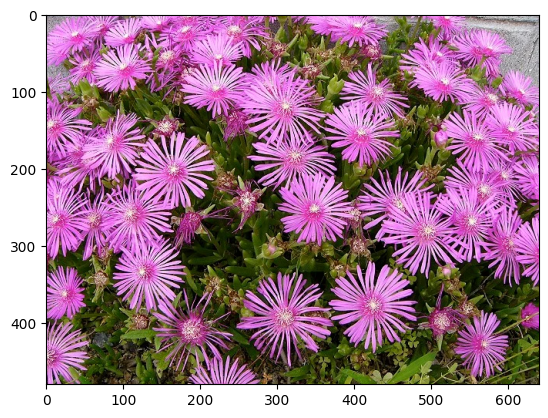

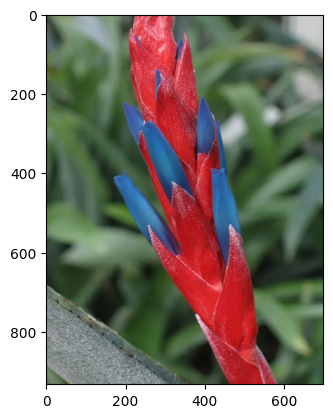

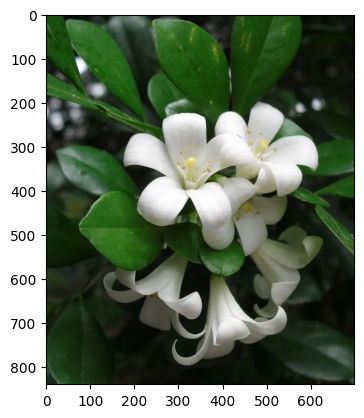

...

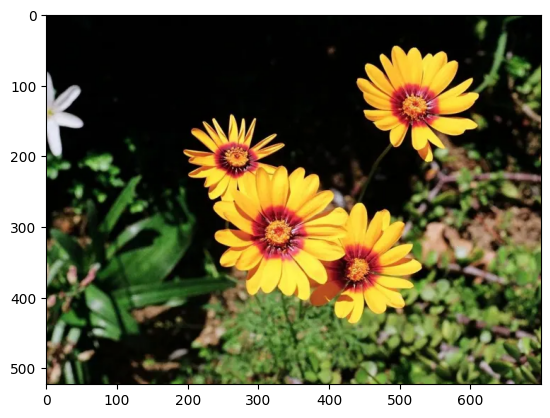

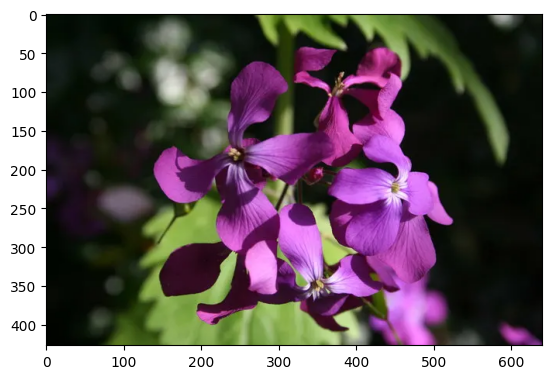

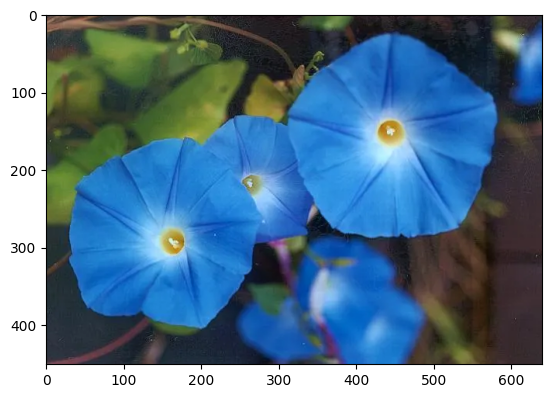

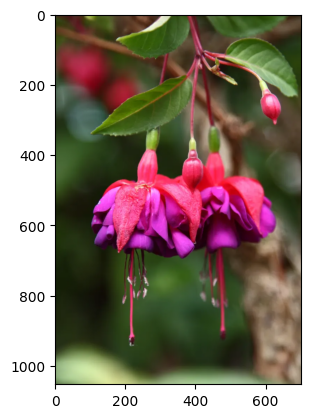

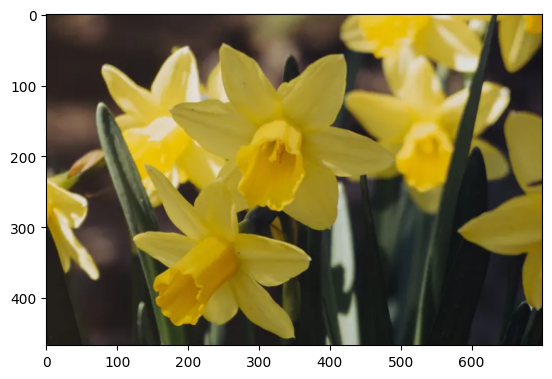

In [ ]:
#Part 1: Generate Captions for Images

# First: create lists to store images and captions
images = []
captions = []

# second : loop through each uploaded image
for filename in uploaded.keys():
    image = Image.open(filename).convert("RGB")
    images.append(image)

    # Process and generate caption
    inputs = processor(images=image, return_tensors="pt")
    outputs = model.generate(**inputs)
    caption = processor.decode(outputs[0], skip_special_tokens=True)
    captions.append(caption)

# Third: display each image with its caption
for img, caption in zip(images, captions):
    plt.imshow(np.asarray(img))
    plt.show()


In [ ]:
!pip install sentence_transformers

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

Score: 0.4483


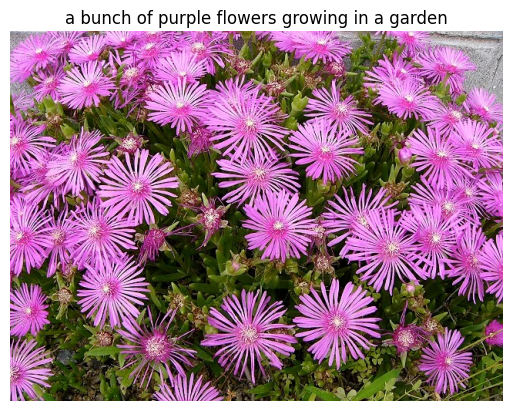

Score: 0.4215


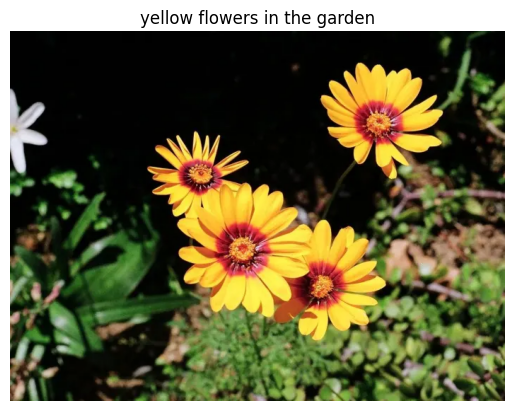

Score: 0.4106


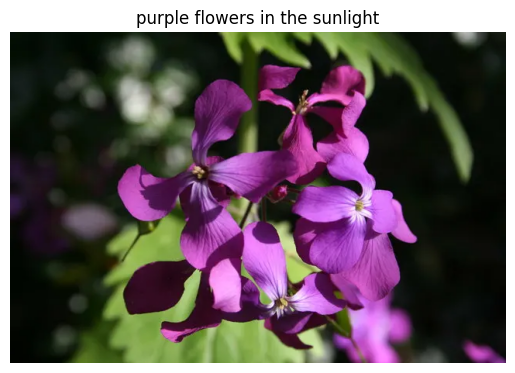

Score: 0.3813


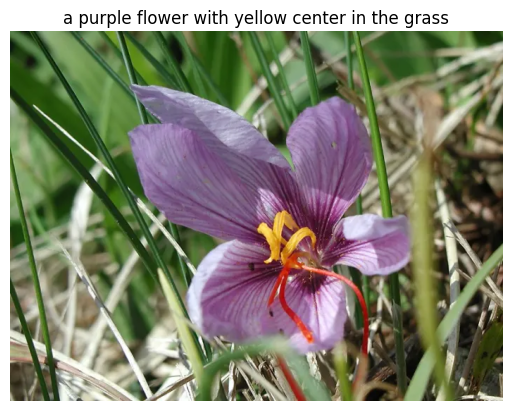

Score: 0.3405


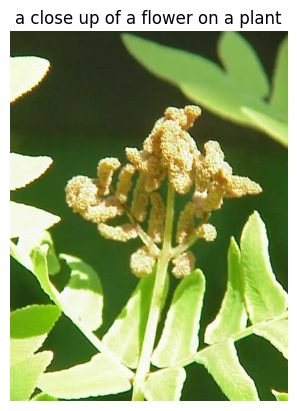

In [ ]:
#Part 2: Build an Image Search Engine
#First :import the model
from sentence_transformers import SentenceTransformer, util
import numpy as np
embedder = SentenceTransformer('all-MiniLM-L6-v2')

caption_embeddings = embedder.encode(captions, convert_to_tensor=True)

# Second: create function to search for similarities
def search_images(query, top_k=5):
    query_embedding = embedder.encode(query, convert_to_tensor=True)
    cos_scores = util.pytorch_cos_sim(query_embedding, caption_embeddings)[0]
    top_results = np.argpartition(-cos_scores, range(top_k))[0:top_k]

    for idx in top_results:
        print(f"Score: {cos_scores[idx]:.4f}")
        plt.imshow(np.asarray(images[idx]))
        plt.title(captions[idx])
        plt.axis('off')
        plt.show()

# Example
query_caption = "Gardens in Ryiadh" #"Gardens in Ryiadh"  can be adjustable
search_images(query_caption)



Higher scores mean the caption is a better match to our query.
result that we get above:
0.4483: Best match to our query.
0.4215: Very close, but not the top match.
0.4106: Still relevant, but less so.
0.3813: Somewhat related, but less close.
0.3405: Least relevant, but still related.
